<a href="https://colab.research.google.com/github/nestormontano/PrDS_2023_09_IAckathon_Anomalias/blob/main/scripts/importar_unir_eda_pruebaModelos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! pip install skimpy

In [ ]:
!pip install -U dataprep

In [ ]:
from skimpy import skim
from dataprep.eda import create_report

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import scipy.stats as st

In [2]:
from textwrap import TextWrapper

In [3]:
''' Esta funcion es una utilitaria para imprimir los nombres de columnas y
que no toque hacer desplazamiento horizontal'''
# wrapper = textwrap.TextWrapper(width=100)
wrapper = TextWrapper(width=100)

## Datos

### Descargar datos

In [4]:
#https://docs.google.com/spreadsheets/d/16xhN600OTMNlhNuXPQFCsDxbhdnyliGS
!gdown --id 16xhN600OTMNlhNuXPQFCsDxbhdnyliGS

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=16xhN600OTMNlhNuXPQFCsDxbhdnyliGS
From (redirected): https://drive.google.com/uc?id=16xhN600OTMNlhNuXPQFCsDxbhdnyliGS&confirm=t&uuid=13b0aa3f-4355-4242-845f-8a1c92ac34b9
To: /content/releases_2022.xlsx
100% 62.6M/62.6M [00:00<00:00, 105MB/s] 


In [5]:
releases = pd.read_excel("/content/releases_2022.xlsx", sheet_name= 'Releases' )

In [6]:
releases.rename(columns={"id": "release_id"}, inplace= True)

In [7]:
releases.columns

Index(['ocid', 'release_id', 'initiationType', 'buyer_id', 'buyer_name',
       'language', 'date', 'tag'],
      dtype='object')

In [9]:
planning = pd.read_excel("/content/releases_2022.xlsx", sheet_name= 'Planning' )

In [10]:
  planning.rename(columns={"id": "planning_id"}, inplace= True)

In [11]:
planning.columns

Index(['ocid', 'planning_id', 'rationale', 'budget_id', 'budget_description',
       'budget_amount', 'budget_currency'],
      dtype='object')

In [12]:
tender = pd.read_excel("/content/releases_2022.xlsx", sheet_name= 'Tender' )

In [13]:
tender.rename(columns={"id": "tender_id"}, inplace= True)

In [14]:
tender.columns

Index(['ocid', 'release_id', 'tender_id', 'title', 'description', 'status',
       'procuringEntity_id', 'procuringEntity_name', 'value_amount',
       'value_currency', 'procurementMethod', 'procurementMethodDetails',
       'mainProcurementCategory', 'awardCriteria', 'tenderPeriod_startDate',
       'tenderPeriod_endDate', 'tenderPeriod_maxExtentDate',
       'tenderPeriod_durationInDays', 'enquiryPeriod_startDate',
       'enquiryPeriod_endDate', 'enquiryPeriod_maxExtentDate',
       'enquiryPeriod_durationInDays', 'hasEnquiries', 'eligibilityCriteria',
       'awardPeriod_startDate', 'awardPeriod_endDate',
       'awardPeriod_maxExtentDate', 'awardPeriod_durationInDays',
       'numberOfTenderers'],
      dtype='object')

In [15]:
awards = pd.read_excel("/content/releases_2022.xlsx", sheet_name= 'Awards' )

In [16]:
awards.rename(columns={"id": "award_id"}, inplace= True)

In [17]:
awards.columns

Index(['ocid', 'release_id', 'award_id', 'title', 'description', 'status',
       'date', 'amount', 'currency', 'correctedValue_amount',
       'correctedValue_currency', 'enteredValue_amount',
       'enteredValue_currency', 'contractPeriod_startDate',
       'contractPeriod_endDate', 'contractPeriod_maxExtentDate',
       'contractPeriod_durationInDays'],
      dtype='object')

In [18]:
award_supp = pd.read_excel("/content/releases_2022.xlsx", sheet_name= 'AwardSuppliers' )

In [19]:
award_supp.rename(columns={"id": "award_supp_id"}, inplace= True)

In [20]:
award_supp.columns

Index(['ocid', 'release_id', 'award_id', 'award_supp_id', 'name'], dtype='object')

In [21]:
contracts = pd.read_excel("/content/releases_2022.xlsx", sheet_name= 'Contracts' )

In [22]:
contracts.rename(columns={"id": "contracts_id", "awardID": "award_id"}, inplace= True)

In [23]:
contracts.columns

Index(['ocid', 'release_id', 'contracts_id', 'award_id', 'title',
       'description', 'status', 'contractPeriod_startDate',
       'contractPeriod_endDate', 'contractPeriod_maxExtentDate',
       'contractPeriod_durationInDays', 'amount', 'currency', 'dateSigned'],
      dtype='object')

### Entender y corregir Datos

#### Verificar unicos ocid

In [24]:
def colSoloUnicos(dataframe, columna):
    """
    Verifica si la columna especificada tiene solo valores únicos.

    Parámetros:
    dataframe (pandas.DataFrame): El DataFrame que contiene la columna.
    columna (str): El nombre de la columna a verificar.

    Retorna:
    bool: True si la columna tiene solo valores únicos, False en caso contrario.
    """
    # Comprueba si el número de valores únicos es igual al número total de filas
    return dataframe[columna].nunique() == dataframe[columna].count()


In [25]:
for df in [releases, planning, tender, awards, award_supp, contracts]:
  print( colSoloUnicos(df, 'ocid') )

True
True
True
False
False
False


In [26]:
for df in [releases, tender, awards, award_supp, contracts]:
  print( colSoloUnicos(df, 'release_id') )

True
True
False
False
False


In [27]:
for df, col in zip([releases, planning, tender, awards, award_supp, contracts], ['release_id', 'planning_id', 'tender_id', 'award_id', 'award_supp_id', 'contracts_id']):
  print( colSoloUnicos(df, col) )

True
True
True
False
False
False


Puedes existir varios awards por cada ocid

In [28]:
awards.groupby('ocid')['award_id'].size().reset_index(name='N').sort_values("N", ascending= False)

,ocid,N
144099,ocds-5wno2w-MCB-GADPE-02-2022-32109,164
144094,ocds-5wno2w-MCB-GADMT-115-2022-36463,106
144074,ocds-5wno2w-MCB-GADMN-CP005-2022-76661,105
144054,ocds-5wno2w-MCB-EPMRQ-001-2022-289323,104
144118,ocds-5wno2w-MCB-GADPRSI-005-2022-128299,102
...,...,...
60100,ocds-5wno2w-CE-20220002206268-534507,1
60101,ocds-5wno2w-CE-20220002206269-534507,1
60102,ocds-5wno2w-CE-20220002206270-534507,1
60103,ocds-5wno2w-CE-20220002206271-534507,1


Y varios ocid por award

In [29]:
awards.groupby('award_id')[['ocid']].size().reset_index(name='N').sort_values("N", ascending= False)

,award_id,N
144889,CE-20220002265567,3
171874,CE-20220002301973,3
171872,CE-20220002301971,3
171871,CE-20220002301970,3
171870,CE-20220002301969,3
...,...,...
60860,CE-20220002146540,1
60861,CE-20220002146541,1
60862,CE-20220002146542,1
60863,CE-20220002146543,1


In [30]:
awards.loc[awards['award_id']=='CE-20220002265567']

,ocid,release_id,award_id,title,description,status,date,amount,currency,correctedValue_amount,correctedValue_currency,enteredValue_amount,enteredValue_currency,contractPeriod_startDate,contractPeriod_endDate,contractPeriod_maxExtentDate,contractPeriod_durationInDays
162314,ocds-5wno2w-CE-20220002265567-431380,CE-20220002265567-431380-2022-12-21T08:20:09.650Z,CE-20220002265567,NaN,NaN,active,NaN,3.18976,USD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
176406,ocds-5wno2w-CE-20220002265567-1160054330001,CE-20220002265567-1160054330001-2023-01-18T08:...,CE-20220002265567,NaN,NaN,active,NaN,3.18976,USD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
177215,ocds-5wno2w-CE-20220002265567-1124762,CE-20220002265567-1124762-2023-01-20T08:21:14....,CE-20220002265567,NaN,NaN,active,NaN,3.18976,USD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [31]:
tender.loc[tender['ocid'].isin(awards.loc[awards['award_id']=='CE-20220002265567']['ocid'])]

,ocid,release_id,tender_id,title,description,status,procuringEntity_id,procuringEntity_name,value_amount,value_currency,...,enquiryPeriod_endDate,enquiryPeriod_maxExtentDate,enquiryPeriod_durationInDays,hasEnquiries,eligibilityCriteria,awardPeriod_startDate,awardPeriod_endDate,awardPeriod_maxExtentDate,awardPeriod_durationInDays,numberOfTenderers
165306,ocds-5wno2w-CE-20220002265567-431380,CE-20220002265567-431380-2022-12-21T08:20:09.650Z,CE-20220002265567-431380,Orden de compra CE-20220002265567,Orden de compra para adquirir los siguientes p...,complete,EC-RUC-1160054330001-431380,MANCOMUNIDAD DE MUNICIPALIDADES DEL SUROCCIDEN...,3.18976,USD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
179673,ocds-5wno2w-CE-20220002265567-1160054330001,CE-20220002265567-1160054330001-2023-01-18T08:...,CE-20220002265567-1160054330001,Orden de compra CE-20220002265567,Orden de compra para adquirir los siguientes p...,complete,NaN,NaN,3.18976,USD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
180497,ocds-5wno2w-CE-20220002265567-1124762,CE-20220002265567-1124762-2023-01-20T08:21:14....,CE-20220002265567-1124762,Orden de compra CE-20220002265567,Orden de compra para adquirir los siguientes p...,complete,EC-RUC-1160054330001-1124762,MANCOMUNIDAD DE MUNICIPALIDADES DEL SUROCCIDEN...,3.18976,USD,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
planning.loc[planning['ocid'].isin(awards.loc[awards['award_id']=='CE-20220002265567']['ocid'])]

,ocid,planning_id,rationale,budget_id,budget_description,budget_amount,budget_currency


In [33]:
releases.loc[releases['ocid'].isin(awards.loc[awards['award_id']=='CE-20220002265567']['ocid'])]

,ocid,release_id,initiationType,buyer_id,buyer_name,language,date,tag
174075,ocds-5wno2w-CE-20220002265567-431380,CE-20220002265567-431380-2022-12-21T08:20:09.650Z,tender,EC-RUC-1160054330001,MANCOMUNIDAD DE MUNICIPALIDADES DEL SUROCCIDEN...,es,2022-09-06T00:00:00-05:00,"[""tender"",""award"",""contract""]"
189069,ocds-5wno2w-CE-20220002265567-1160054330001,CE-20220002265567-1160054330001-2023-01-18T08:...,tender,EC-RUC-1160054330001,MANCOMUNIDAD DE MUNICIPALIDADES DEL SUROCCIDEN...,es,2022-09-06T00:00:00-05:00,"[""tender"",""award"",""contract""]"
189893,ocds-5wno2w-CE-20220002265567-1124762,CE-20220002265567-1124762-2023-01-20T08:21:14....,tender,EC-RUC-1160054330001,MANCOMUNIDAD DE MUNICIPALIDADES DEL SUROCCIDEN...,es,2022-09-06T00:00:00-05:00,"[""tender"",""award"",""contract""]"


In [34]:
## Parece ser que la combinación 'ocid', 'award_id' es única
awards.groupby(['ocid', 'award_id'])[['title']].size().reset_index(name='N').sort_values("N", ascending= False)

,ocid,award_id,N
0,ocds-5wno2w-.MCO-GADMP-05-2022.-27207,5792228-.MCO-GADMP-05-2022.,1
121842,ocds-5wno2w-CE-20220002292353-479937,CE-20220002292353,1
121822,ocds-5wno2w-CE-20220002292331-2547,CE-20220002292331,1
121823,ocds-5wno2w-CE-20220002292334-30573,CE-20220002292334,1
121824,ocds-5wno2w-CE-20220002292335-30573,CE-20220002292335,1
...,...,...,...
60914,ocds-5wno2w-CE-20220002207555-258814,CE-20220002207555,1
60915,ocds-5wno2w-CE-20220002207556-258814,CE-20220002207556,1
60916,ocds-5wno2w-CE-20220002207557-258814,CE-20220002207557,1
60917,ocds-5wno2w-CE-20220002207558-258814,CE-20220002207558,1


In [35]:
award_supp.groupby('award_supp_id')[['ocid']].size().reset_index(name='N').sort_values("N", ascending= False)

,award_supp_id,N
17091,EC-RUC-1790732657001-2854,54474
17309,EC-RUC-1791362160001-5430,4687
18006,EC-RUC-1792385512001-485219,3350
17707,EC-RUC-1792092108001-168552,3193
15626,EC-RUC-1713823365001-52654,2979
...,...,...
9462,EC-RUC-1003777180001-946151,1
9463,EC-RUC-1003859517001-1102017,1
9465,EC-RUC-1003887492001-974737,1
9466,EC-RUC-1003888862001-739700,1


In [36]:
award_supp.groupby(['ocid', 'award_id'])[['ocid']].size().reset_index(name='N').sort_values("N", ascending= False)

,ocid,award_id,N
0,ocds-5wno2w-.MCO-GADMP-05-2022.-27207,5792228-.MCO-GADMP-05-2022.,1
121842,ocds-5wno2w-CE-20220002292353-479937,CE-20220002292353,1
121822,ocds-5wno2w-CE-20220002292331-2547,CE-20220002292331,1
121823,ocds-5wno2w-CE-20220002292334-30573,CE-20220002292334,1
121824,ocds-5wno2w-CE-20220002292335-30573,CE-20220002292335,1
...,...,...,...
60914,ocds-5wno2w-CE-20220002207555-258814,CE-20220002207555,1
60915,ocds-5wno2w-CE-20220002207556-258814,CE-20220002207556,1
60916,ocds-5wno2w-CE-20220002207557-258814,CE-20220002207557,1
60917,ocds-5wno2w-CE-20220002207558-258814,CE-20220002207558,1


In [37]:
contracts.groupby('ocid')[['ocid']].size().reset_index(name='N').sort_values("N", ascending= False)

,ocid,N
141384,ocds-5wno2w-MCB-GADPE-02-2022-32109,164
141380,ocds-5wno2w-MCB-GADMT-115-2022-36463,106
141364,ocds-5wno2w-MCB-GADMN-CP005-2022-76661,105
141350,ocds-5wno2w-MCB-EPMRQ-001-2022-289323,104
141323,ocds-5wno2w-MCB-CCFFAA-003-2022-2539,85
...,...,...
56466,ocds-5wno2w-CE-20220002202325-41357,1
56467,ocds-5wno2w-CE-20220002202326-41357,1
56468,ocds-5wno2w-CE-20220002202327-41357,1
56469,ocds-5wno2w-CE-20220002202328-2539,1


In [38]:
contracts.groupby('contracts_id')[['ocid']].size().reset_index(name='N').sort_values("N", ascending= False)

,contracts_id,N
160427,CE-20220002301965-contract,3
87347,CE-20220002199484-contract,3
36335,CE-20220002127957-contract,3
138657,CE-20220002272444-contract,3
142835,CE-20220002277766-contract,3
...,...,...
57045,CE-20220002157301-contract,1
57046,CE-20220002157302-contract,1
57047,CE-20220002157303-contract,1
57048,CE-20220002157304-contract,1


In [39]:
contracts.groupby(['ocid', 'award_id'])[['ocid']].size().reset_index(name='N').sort_values("N", ascending= False)

,ocid,award_id,N
144296,ocds-5wno2w-MCO-ETPMM-EP-04-2022-250950,5769585-MCO-ETPMM-EP-04-2022,2
154365,ocds-5wno2w-SIE-1BI-004-2022-103880,2029554-SIE-1BI-004-2022,2
139953,ocds-5wno2w-COTS-SZE-001-2022-110642,5362321-COTS-SZE-001-2022,2
143621,ocds-5wno2w-MCO-BALAG-003-2022-108230,5874765-MCO-BALAG-003-2022,2
146922,ocds-5wno2w-MCS-ARCFIZ-05-2022-869714,5582492-MCS-ARCFIZ-05-2022,2
...,...,...,...
57099,ocds-5wno2w-CE-20220002203269-480811,CE-20220002203269,1
57100,ocds-5wno2w-CE-20220002203270-480811,CE-20220002203270,1
57101,ocds-5wno2w-CE-20220002203271-480811,CE-20220002203271,1
57102,ocds-5wno2w-CE-20220002203272-480811,CE-20220002203272,1


In [40]:
contracts.loc[ (contracts['ocid']== 'ocds-5wno2w-MCO-ETPMM-EP-04-2022-250950') & (contracts['award_id']== '5769585-MCO-ETPMM-EP-04-2022' )]

,ocid,release_id,contracts_id,award_id,title,description,status,contractPeriod_startDate,contractPeriod_endDate,contractPeriod_maxExtentDate,contractPeriod_durationInDays,amount,currency,dateSigned
77285,ocds-5wno2w-MCO-ETPMM-EP-04-2022-250950,MCO-ETPMM-EP-04-2022-250950-2023-01-17T09:55:2...,2134621-MCO-ETPMM-EP-04-2022,5769585-MCO-ETPMM-EP-04-2022,NaN,NaN,terminated,2022-09-27T00:00:00-05:00,2022-10-27T00:00:00-05:00,NaN,30.0,19861.37,USD,2022-09-13T00:00:00-05:00
77286,ocds-5wno2w-MCO-ETPMM-EP-04-2022-250950,MCO-ETPMM-EP-04-2022-250950-2023-01-17T09:55:2...,2152442-MCO-ETPMM-EP-04-2022,5769585-MCO-ETPMM-EP-04-2022,NaN,NaN,terminated,2022-12-14T00:00:00-05:00,2022-12-19T00:00:00-05:00,NaN,5.0,5000.00,USD,2022-12-14T00:00:00-05:00


#### Unir datos

In [41]:
base = releases.merge(planning, how= 'outer', on= 'ocid')
base.columns

Index(['ocid', 'release_id', 'initiationType', 'buyer_id', 'buyer_name',
       'language', 'date', 'tag', 'planning_id', 'rationale', 'budget_id',
       'budget_description', 'budget_amount', 'budget_currency'],
      dtype='object')

In [42]:
base = base.merge(tender, how= 'outer', on= ['ocid', 'release_id'])

In [43]:
base.columns

Index(['ocid', 'release_id', 'initiationType', 'buyer_id', 'buyer_name',
       'language', 'date', 'tag', 'planning_id', 'rationale', 'budget_id',
       'budget_description', 'budget_amount', 'budget_currency', 'tender_id',
       'title', 'description', 'status', 'procuringEntity_id',
       'procuringEntity_name', 'value_amount', 'value_currency',
       'procurementMethod', 'procurementMethodDetails',
       'mainProcurementCategory', 'awardCriteria', 'tenderPeriod_startDate',
       'tenderPeriod_endDate', 'tenderPeriod_maxExtentDate',
       'tenderPeriod_durationInDays', 'enquiryPeriod_startDate',
       'enquiryPeriod_endDate', 'enquiryPeriod_maxExtentDate',
       'enquiryPeriod_durationInDays', 'hasEnquiries', 'eligibilityCriteria',
       'awardPeriod_startDate', 'awardPeriod_endDate',
       'awardPeriod_maxExtentDate', 'awardPeriod_durationInDays',
       'numberOfTenderers'],
      dtype='object')

In [44]:
contr_award = contracts.groupby(['ocid', 'award_id']).agg({'amount': 'sum', 'contracts_id': 'size', 'contractPeriod_durationInDays': 'sum'}).reset_index()
contr_award.rename(columns={'amount': 'sum_contr', 'contracts_id': 'n_contr', 'contractPeriod_durationInDays': 'durac_cont_tot'}, inplace= True)

In [45]:
contr_award

,ocid,award_id,sum_contr,n_contr,durac_cont_tot
0,ocds-5wno2w-.MCO-GADMP-05-2022.-27207,5792228-.MCO-GADMP-05-2022.,32022.54,1,60.0
1,ocds-5wno2w-001-CDC-CCENL-2022-81401,5688371-001-CDC-CCENL-2022,1427.70,1,10.0
2,ocds-5wno2w-001-LICS-CBT-001-202-142333,5393270-001-LICS-CBT-001-202,9551.62,1,30.0
3,ocds-5wno2w-001-LICS-CBT-001-202-142333,5393299-001-LICS-CBT-001-202,945.02,1,30.0
4,ocds-5wno2w-01D06-MCO-0001-2022-535961,5566739-01D06-MCO-0001-2022,41626.85,1,45.0
...,...,...,...,...,...
171290,ocds-5wno2w-SIIE-HEJCA-B-256-202-87497,2040670-SIIE-HEJCA-B-256-202,35124.32,1,120.0
171291,ocds-5wno2w-SRI-SRINAC-031-2022-2438,2009985-SRI-SRINAC-031-2022,260000.00,1,730.0
171292,ocds-5wno2w-SSIE-MDMQ-AZM-06-202-41357,1933586-SSIE-MDMQ-AZM-06-202,16888.00,1,240.0
171293,ocds-5wno2w-SVP-CEBAL-2022-01-95186,1895704-SVP-CEBAL-2022-01,95000.00,1,1095.0


In [46]:
base_awards = awards.merge(award_supp, how= 'outer', on= ['ocid', 'release_id', 'award_id'])
base_awards.columns

Index(['ocid', 'release_id', 'award_id', 'title', 'description', 'status',
       'date', 'amount', 'currency', 'correctedValue_amount',
       'correctedValue_currency', 'enteredValue_amount',
       'enteredValue_currency', 'contractPeriod_startDate',
       'contractPeriod_endDate', 'contractPeriod_maxExtentDate',
       'contractPeriod_durationInDays', 'award_supp_id', 'name'],
      dtype='object')

In [47]:
base_awards = base_awards.merge(contr_award, how= 'outer', on= ['ocid', 'award_id'])

In [48]:
base_awards.columns

Index(['ocid', 'release_id', 'award_id', 'title', 'description', 'status',
       'date', 'amount', 'currency', 'correctedValue_amount',
       'correctedValue_currency', 'enteredValue_amount',
       'enteredValue_currency', 'contractPeriod_startDate',
       'contractPeriod_endDate', 'contractPeriod_maxExtentDate',
       'contractPeriod_durationInDays', 'award_supp_id', 'name', 'sum_contr',
       'n_contr', 'durac_cont_tot'],
      dtype='object')

#### Descriptivas

In [ ]:
skim(base)

/usr/local/lib/python3.10/dist-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 195456 │ │ string      │ 32    │                                                          │
│ │ Number of columns │ 40     │ │ float64     │ 8     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━━┳━━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name      ┃ NA     ┃ NA %  ┃ mean   ┃ sd      ┃ p0    ┃ p25   ┃ p50   ┃ p75    ┃ p100      ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━━╇━━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━┩  │
│ │ budget_descripti │ 195456 │   100 │    nan │     nan │   nan │   nan │   nan │    nan │       nan │        │  │
│ │ on               │        │       │        │         │       │       │       │        │           │        │  │
│ │ budget_amount    │ 167013 │ 85.45 │ 220000 │ 1900000 │     3 │ 14000 │ 39000 │ 120000 │ 200000000 │   ▇    │  │
│ │ value_amount     │  35721 │ 18.28 │  36000 │  690000 │ 0.017 │    25 │   200 │   3200 │ 200000000 │   ▇    │  │
│ │ tenderPeriod_dur │ 176360 │ 90.23 │     10 │     8.5 │     1 │     5 │     8 │     14 │       170 │   ▇    │  │
│ │ ationInDays      │        │       │        │         │       │       │       │        │           │        │  │
│ │ enquiryPeriod_du │ 153963 │ 78.77 │    3.6 │     4.7 │     1 │     1 │     3 │      5 │       160 │   ▇    │  │
│ │ rationInDays     │        │       │        │         │       │       │       │        │           │        │  │
│ │ hasEnquiries     │ 163790 │  83.8 │      1 │       0 │     1 │     1 │     1 │      1 │         1 │     ▇  │  │
│ │ awardPeriod_dura │ 170157 │ 87.06 │    5.8 │      15 │     1 │     3 │     5 │      6 │       740 │   ▇    │  │
│ │ tionInDays       │        │       │        │         │       │       │       │        │           │        │  │
│ │ numberOfTenderer │ 146891 │ 75.15 │    5.4 │      24 │     1 │     1 │     2 │      4 │       580 │   ▇    │  │
│ │ s                │        │       │        │         │       │       │       │        │           │        │  │
│ └──────────────────┴────────┴───────┴────────┴─────────┴───────┴───────┴───────┴────────┴───────────┴────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓  │
│ ┃ column_name                        ┃ NA          ┃ NA %      ┃ words per row          ┃ total words        ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━┩  │
│ │ ocid                               │           0 │         0 │                      1 │             195471 │  │
│ │ release_id                         │           0 │         0 │                      1 │             195471 │  │
│ │ initiationType                     │           0 │         0 │                      1 │             195456 │  │
│ │ buyer_id                           │           0 │         0 │                      1 │             195456 │  │
│ │ buyer_name                         │           0 │  

#### Filtrar tender no vacio

In [ ]:
base_cleaned = base.loc[base['tender_id'].notnull() & base['procurementMethod'].notnull() & base['procurementMethodDetails'].notnull() ]

### Ingenieria de Variables

Vamos a crear variables que puedan dar indicios al modelo, por ejemplo:   
**OCID**
- Cantidad de Awards diferentes
- Suma de los valores finales que ofertaron los ganadores

**OCID y Award**
- Cuantos ocid  diferentes ha ganado el proveedor (es decir, el proveedor cuantos concursos ha ganado)
- Cuantos buyerID diferentes tiene (es decir, el proveedor con cuantos organismo estatales ha trabajado)
- Porcentaje de dolares contratados que el BuyerID ha contratado con el Award (que podría decirnos casos donde cada contratacion directa lo gana el mismo award)
- Cantidad de contratos diferentes del tipo analizado que ha lanzado el BuyerID
- Diferencia en porcentje entre el valor del tender vs el valor de awards y de los contratos
- Promedio de tenders que participan cuando el AwardID ha ganado, en ese BuyerID
- Promedio de tenders que participan para el BuyerID


#### Asociadas a awards

Vamos a obtener variables a nivel de ocid a partir de los awards

https://standard.open-contracting.org/latest/en/schema/reference/#award

In [ ]:
awards.columns

Index(['ocid', 'release_id', 'award_id', 'title', 'description', 'status',
       'date', 'amount', 'currency', 'correctedValue_amount',
       'correctedValue_currency', 'enteredValue_amount',
       'enteredValue_currency', 'contractPeriod_startDate',
       'contractPeriod_endDate', 'contractPeriod_maxExtentDate',
       'contractPeriod_durationInDays'],
      dtype='object')

In [ ]:
# awards.groupby('ocid').agg({'amount': 'sum', 'contractPeriod_durationInDays': 'max'}).reset_index()

In [ ]:
# Definir una función personalizada para aplicar a cada grupo
def ing_var_awards(df):
    return pd.Series({'Num_Award': df['award_id'].nunique(),
                      'Sum_Award': df['amount'].sum(),
                      'MaxDuration': df['contractPeriod_durationInDays'].max()})


In [ ]:
# Aplicar la función a cada grupo por ocid
ocidvar_awards = awards.groupby('ocid').apply(ing_var_awards)

In [ ]:
ocidvar_awards.columns

Index(['Num_Award', 'Sum_Award', 'MaxDuration'], dtype='object')

In [ ]:
base = base.merge(ocidvar_awards, how= 'outer', on= ['ocid'])

In [ ]:
base.columns

Index(['ocid', 'release_id', 'initiationType', 'buyer_id', 'buyer_name',
       'language', 'date', 'tag', 'planning_id', 'rationale', 'budget_id',
       'budget_description', 'budget_amount', 'budget_currency', 'tender_id',
       'title', 'description', 'status', 'procuringEntity_id',
       'procuringEntity_name', 'value_amount', 'value_currency',
       'procurementMethod', 'procurementMethodDetails',
       'mainProcurementCategory', 'awardCriteria', 'tenderPeriod_startDate',
       'tenderPeriod_endDate', 'tenderPeriod_maxExtentDate',
       'tenderPeriod_durationInDays', 'enquiryPeriod_startDate',
       'enquiryPeriod_endDate', 'enquiryPeriod_maxExtentDate',
       'enquiryPeriod_durationInDays', 'hasEnquiries', 'eligibilityCriteria',
       'awardPeriod_startDate', 'awardPeriod_endDate',
       'awardPeriod_maxExtentDate', 'awardPeriod_durationInDays',
       'numberOfTenderers', 'Num_Award', 'Sum_Award', 'MaxDuration'],
      dtype='object')

#### Asociadas al Buyer

In [ ]:
base.head()

,ocid,release_id,initiationType,buyer_id,buyer_name,language,date,tag,planning_id,rationale,...,hasEnquiries,eligibilityCriteria,awardPeriod_startDate,awardPeriod_endDate,awardPeriod_maxExtentDate,awardPeriod_durationInDays,numberOfTenderers,Num_Award,Sum_Award,MaxDuration
0,ocds-5wno2w-MCO-EPMAPS-GT32-2022-258814,MCO-EPMAPS-GT32-2022-258814-2023-02-11T11:00:2...,tender,EC-RUC-1768154260001-258814,Empresa Pública Metropolitana de Agua Potable ...,es,2023-02-11T06:02:27-05:00,"[""planning"",""tender"",""award""]",MCO-EPMAPS-GT32-2022-258814-2023-02-11T11:00:2...,CONSTRUCCIÓN DEL PROYECTO: OBRAS DE PROTECCIÓ...,...,1.0,"Trabajos similares exitosos,Participación Naci...",NaN,2023-01-31T18:00:00-05:00,2023-01-31T18:00:00-05:00,NaN,46.0,1.0,233105.98000,NaN
1,ocds-5wno2w-MCO-MAATE-005-2022-1007399,MCO-MAATE-005-2022-1007399-2023-02-11T10:52:12...,tender,EC-RUC-1768192860001-1007399,"MINISTERIO DEL AMBIENTE, AGUA Y TRANSICION ECO...",es,2023-02-11T06:02:30-05:00,"[""planning"",""tender"",""award"",""contract""]",MCO-MAATE-005-2022-1007399-2023-02-11T10:52:12...,CONSTRUCCIÓN DE UNA GUARDIANÍA PARA LA RESERVA...,...,1.0,"Metodología y Cronograma,Equipo Propuesto,Pers...",NaN,2022-08-30T20:00:00-05:00,2022-08-30T20:00:00-05:00,NaN,3.0,1.0,143938.73000,NaN
2,ocds-5wno2w-MCS-GADMCQ-009-2022-36121,MCS-GADMCQ-009-2022-36121-2023-02-11T11:01:44....,tender,EC-RUC-0860000590001-36121,GAD MUNICIPAL DE QUININDE,es,2022-12-28T00:00:00-05:00,"[""planning""]",MCS-GADMCQ-009-2022-36121-2023-02-11T11:01:44....,SERVICIO DE REALIZACIÓN DE SEÑALÉTICA Y DEMARC...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ocds-5wno2w-SIE-GADMC-021-2022-35903,SIE-GADMC-021-2022-35903-2023-02-11T10:59:17.6...,tender,EC-RUC-1160000400001-35903,GOBIERNO AUTONOMO DESCENTRALIZADO MUNICIPAL DE...,es,2023-02-11T06:02:41-05:00,"[""planning"",""tender"",""award""]",SIE-GADMC-021-2022-35903-2023-02-11T10:59:17.6...,“ADQUISICIÓN DE UN RECOLECTOR DE BASURA DE 25 ...,...,1.0,NaN,2023-02-02T13:00:00-05:00,2023-02-08T20:00:00-05:00,2023-02-08T20:00:00-05:00,6.0,2.0,1.0,330680.92000,NaN
4,ocds-5wno2w-CE-20220002238648-3214,CE-20220002238648-3214-2023-02-13T08:02:37.344Z,tender,EC-RUC-1790053881001,EMPRESA ELÉCTRICA QUITO S.A. E.E.Q.,es,2022-07-13T00:00:00-05:00,"[""tender"",""award"",""contract""]",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,9087.55064,NaN


In [ ]:
# Definir una función personalizada para aplicar a cada grupo
def ing_var_buyer(group):
    return pd.Series({
        # Numeros de ocid por buyerID
        'Byr_Num_ocid': group['ocid'].nunique(),
        # Total dolares en contratos del buyerID
        'Byr_Bdgt_Tot': group['value_amount'].sum(),
        # Promedio de participantes en licitacion
        'Byr_Bdgt_Mean': st.trim_mean( group['value_amount'].dropna(), 0.05),
        # Promedio de la duracion de licitacion
        'Byr_TndrDurat_Mean': st.trim_mean( group['tenderPeriod_durationInDays'].dropna(), 0.05),
        # Promedio de participantes en licitacion
        'Byr_NumTndr_Mean': st.trim_mean( group['numberOfTenderers'].dropna(), 0.05),
        # Promedio de licitaciones con un participante
        'Byr_NumLic_UnTndr': group.loc[group['numberOfTenderers'] == 1]['ocid'].nunique()
        # Numero de contratos directos del Buyer
        'Byr_Num_direct': group.loc[ group['procurementMethod']=='direct']['ocid'].nunique(),
        # Numero de contratos seleccion del Buyer
        'Byr_Num_selective': group.loc[ group['procurementMethod']=='selective']['ocid'].nunique(),
        # Numero de contratos limited  del Buyer
        'Byr_Num_limited': group.loc[ group['procurementMethod']=='limited']['ocid'].nunique(),
        # Numero de contratos open  del Buyer
        'Byr_Num_open': group.loc[ group['procurementMethod']=='open']['ocid'].nunique()
                      })

In [ ]:
# Aplicar la función a cada grupo por ocid
ocidvar_byr = base.groupby('buyer_id').apply(ing_var_buyer)

In [ ]:
ocidvar_byr.columns

Index(['Byr_Num_ocid', 'Byr_Bdgt_Tot', 'Byr_TndrDurat_Mean',
       'Byr_NumTndr_Mean', 'Byr_Num_direct', 'Byr_Num_selective',
       'Byr_Num_D_BieServ'],
      dtype='object')

In [ ]:
base = base.merge(ocidvar_byr, how= 'outer', on= ['buyer_id'])

In [ ]:
base.columns

Index(['ocid', 'release_id', 'initiationType', 'buyer_id', 'buyer_name',
       'language', 'date', 'tag', 'planning_id', 'rationale', 'budget_id',
       'budget_description', 'budget_amount', 'budget_currency', 'tender_id',
       'title', 'description', 'status', 'procuringEntity_id',
       'procuringEntity_name', 'value_amount', 'value_currency',
       'procurementMethod', 'procurementMethodDetails',
       'mainProcurementCategory', 'awardCriteria', 'tenderPeriod_startDate',
       'tenderPeriod_endDate', 'tenderPeriod_maxExtentDate',
       'tenderPeriod_durationInDays', 'enquiryPeriod_startDate',
       'enquiryPeriod_endDate', 'enquiryPeriod_maxExtentDate',
       'enquiryPeriod_durationInDays', 'hasEnquiries', 'eligibilityCriteria',
       'awardPeriod_startDate', 'awardPeriod_endDate',
       'awardPeriod_maxExtentDate', 'awardPeriod_durationInDays',
       'numberOfTenderers', 'Num_Award', 'Sum_Award', 'MaxDuration',
       'Byr_Num_ocid', 'Byr_Bdgt_Tot', 'Byr_TndrDurat_Me

#### Asociadas al Award y Buyer

In [ ]:
base_awards.columns

Index(['ocid', 'release_id', 'award_id', 'title', 'description', 'status',
       'date', 'amount', 'currency', 'correctedValue_amount',
       'correctedValue_currency', 'enteredValue_amount',
       'enteredValue_currency', 'contractPeriod_startDate',
       'contractPeriod_endDate', 'contractPeriod_maxExtentDate',
       'contractPeriod_durationInDays', 'award_supp_id', 'name', 'sum_contr',
       'n_contr', 'durac_cont_tot'],
      dtype='object')

In [ ]:
base_awards.head()

,ocid,release_id,award_id,title,description,status,date,amount,currency,correctedValue_amount,...,enteredValue_currency,contractPeriod_startDate,contractPeriod_endDate,contractPeriod_maxExtentDate,contractPeriod_durationInDays,award_supp_id,name,sum_contr,n_contr,durac_cont_tot
0,ocds-5wno2w-MCO-EPMAPS-GT32-2022-258814,MCO-EPMAPS-GT32-2022-258814-2023-02-11T11:00:2...,6140307-MCO-EPMAPS-GT32-2022,NaN,Proveedor ganador en el Sorteo MC-Obras con es...,NaN,NaN,233105.98000,USD,NaN,...,NaN,NaN,NaN,NaN,NaN,EC-RUC-1792851963001-884897,CONSTRUCTORA IBARRA CEDEÑO IBA&CED CIA. LTDA.,NaN,NaN,NaN
1,ocds-5wno2w-MCO-MAATE-005-2022-1007399,MCO-MAATE-005-2022-1007399-2023-02-11T10:52:12...,5808394-MCO-MAATE-005-2022,NaN,Proveedor ganador en el Sorteo MC-Obras con es...,NaN,NaN,143938.73000,USD,NaN,...,NaN,NaN,NaN,NaN,NaN,EC-RUC-1900530575001-790872,ILLESCAS ZHININ GALO JAVIER,143938.73,1.0,90.0
2,ocds-5wno2w-SIE-GADMC-021-2022-35903,SIE-GADMC-021-2022-35903-2023-02-11T10:59:17.6...,2080101-SIE-GADMC-021-2022,NaN,Según informe en Oficio Nro. 001-COM-TEC-SIE-0...,NaN,2023-02-10T19:00:47-05:00,330680.92000,USD,NaN,...,NaN,NaN,NaN,NaN,NaN,EC-RUC-0190316025001-80865,COMERCIAL CARLOS ROLDAN CIA. LTDA.,NaN,NaN,NaN
3,ocds-5wno2w-CE-20220002238648-3214,CE-20220002238648-3214-2023-02-13T08:02:37.344Z,CE-20220002238648,NaN,NaN,active,NaN,9087.55064,USD,NaN,...,NaN,NaN,NaN,NaN,NaN,EC-RUC-1708525678001-1146,Buri Caraguay Victor Emilio,0.00,1.0,0.0
4,ocds-5wno2w-CE-20220002238650-3214,CE-20220002238650-3214-2023-02-13T08:02:37.557Z,CE-20220002238650,NaN,NaN,active,NaN,5460.94080,USD,NaN,...,NaN,NaN,NaN,NaN,NaN,EC-RUC-1790554295001-2337,BUESTAN CIA. LTDA.,0.00,1.0,0.0


In [ ]:
basef= base.merge( base_awards, how= 'outer', on= ['ocid', 'release_id'])
basef.columns

Index(['ocid', 'release_id', 'initiationType', 'buyer_id', 'buyer_name',
       'language', 'date_x', 'tag', 'planning_id', 'rationale', 'budget_id',
       'budget_description', 'budget_amount', 'budget_currency', 'tender_id',
       'title_x', 'description_x', 'status_x', 'procuringEntity_id',
       'procuringEntity_name', 'value_amount', 'value_currency',
       'procurementMethod', 'procurementMethodDetails',
       'mainProcurementCategory', 'awardCriteria', 'tenderPeriod_startDate',
       'tenderPeriod_endDate', 'tenderPeriod_maxExtentDate',
       'tenderPeriod_durationInDays', 'enquiryPeriod_startDate',
       'enquiryPeriod_endDate', 'enquiryPeriod_maxExtentDate',
       'enquiryPeriod_durationInDays', 'hasEnquiries', 'eligibilityCriteria',
       'awardPeriod_startDate', 'awardPeriod_endDate',
       'awardPeriod_maxExtentDate', 'awardPeriod_durationInDays',
       'numberOfTenderers', 'Num_Award', 'Sum_Award', 'MaxDuration',
       'Byr_Num_ocid', 'Byr_Bdgt_Tot', 'Byr_Tndr

In [ ]:
# Definir una función personalizada para aplicar a cada grupo
def ing_var_ByrAwrd(group):
    return pd.Series({
        # # COntratos por comprador y proveedor
        'ByrAwrd_Num_ocid': group['ocid'].nunique(),
        'ByrAwrd_Bdgt_Tot': group['amount'].sum(),
        'ByrAwrd_TndrDurat_Mean': st.trim_mean( group['tenderPeriod_durationInDays'].dropna(), 0.05),
        'ByrAwrd_NumTndr_Mean': st.trim_mean( group['numberOfTenderers'].dropna(), 0.05),
        'ByrAwrd_Num_direct': group.loc[ group['procurementMethod']=='direct']['ocid'].nunique(),
        'ByrAwrd_Num_selective': group.loc[ group['procurementMethod']=='selective']['ocid'].nunique(),

                      })

In [ ]:
# Aplicar la función a cada grupo por ocid
ByrAwrd_var = basef.groupby(['buyer_id', 'award_id']).apply(ing_var_ByrAwrd)

In [ ]:
ByrAwrd_var.columns

Index(['ByrAwrd_Num_ocid', 'ByrAwrd_Bdgt_Tot', 'ByrAwrd_TndrDurat_Mean',
       'ByrAwrd_NumTndr_Mean', 'ByrAwrd_Num_direct', 'ByrAwrd_Num_selective',
       'ByrAwrd_Num_D_BieServ'],
      dtype='object')

In [ ]:
basef = basef.merge(ByrAwrd_var, how= 'outer', on= ['buyer_id', 'award_id'])

In [ ]:
basef.columns

Index(['ocid', 'release_id', 'initiationType', 'buyer_id', 'buyer_name',
       'language', 'date_x', 'tag', 'planning_id', 'rationale', 'budget_id',
       'budget_description', 'budget_amount', 'budget_currency', 'tender_id',
       'title_x', 'description_x', 'status_x', 'procuringEntity_id',
       'procuringEntity_name', 'value_amount', 'value_currency',
       'procurementMethod', 'procurementMethodDetails',
       'mainProcurementCategory', 'awardCriteria', 'tenderPeriod_startDate',
       'tenderPeriod_endDate', 'tenderPeriod_maxExtentDate',
       'tenderPeriod_durationInDays', 'enquiryPeriod_startDate',
       'enquiryPeriod_endDate', 'enquiryPeriod_maxExtentDate',
       'enquiryPeriod_durationInDays', 'hasEnquiries', 'eligibilityCriteria',
       'awardPeriod_startDate', 'awardPeriod_endDate',
       'awardPeriod_maxExtentDate', 'awardPeriod_durationInDays',
       'numberOfTenderers', 'Num_Award', 'Sum_Award', 'MaxDuration',
       'Byr_Num_ocid', 'Byr_Bdgt_Tot', 'Byr_Tndr

### Filtrar el tipo de contrato con el que va a trabajar el grupo

In [ ]:
basef.shape

(1948, 84)

In [ ]:
basef= basef.loc[ (basef['procurementMethod']=='direct') & (basef['procurementMethodDetails']=='Bienes y Servicios únicos')]
basef.shape

(1948, 78)

In [ ]:
basef['Porc_NumOcid_AwardByr']=basef['ByrAwrd_Num_ocid'] / basef['Byr_Num_ocid']

In [ ]:
basef['Porc_Amount_vs_Bdgt_AwardByr']=basef['ByrAwrd_Bdgt_Tot'] / basef['Byr_Bdgt_Tot']

In [ ]:
basef['Ratio_NumTndr_Mean_AwardByr']=basef['ByrAwrd_NumTndr_Mean'] / basef['Byr_NumTndr_Mean']

In [ ]:
basef['Porc_direct_AwardByr']=basef['ByrAwrd_Num_direct'] / basef['Byr_Num_direct']
basef['Porc_selective_AwardByr']=basef['ByrAwrd_Num_selective'] / basef['Byr_Num_selective']
basef['Porc_D_BieServ_AwardByr']=basef['ByrAwrd_Num_D_BieServ'] / basef['Byr_Num_D_BieServ']

### EDA

In [ ]:
base.groupby(['procurementMethod', 'procurementMethodDetails'])['ocid'].count().reset_index().sort_values("ocid", ascending= False)

,procurementMethod,procurementMethodDetails,ocid
463,selective,Catálogo electrónico - Mejor oferta en el conv...,53851
414,open,Subasta Inversa Electrónica,26324
462,selective,Catálogo electrónico - Mejor oferta en el conv...,24168
4,direct,Catálogo electrónico - Compra directa en el co...,17721
464,selective,Menor Cuantía,8436
...,...,...,...
324,direct,Catálogo electrónico - Compra directa en el co...,1
267,direct,Catálogo electrónico - Compra directa en el co...,1
320,direct,Catálogo electrónico - Compra directa en el co...,1
283,direct,Catálogo electrónico - Compra directa en el co...,1


In [ ]:
base.groupby(['buyer_id', 'buyer_name'])['ocid'].count().reset_index().sort_values("ocid", ascending= False)

,buyer_id,buyer_name,ocid
3408,EC-RUC-1760003410001,GOBIERNO AUTONOMO DESCENTRALIZADO DEL DISTRITO...,1578
1857,EC-RUC-0968599020001-462114,EMPRESA ELÉCTRICA PÚBLICA ESTRATÉGICA CORPORAC...,1116
4072,EC-RUC-1768152800001-238940,CORPORACION ELECTRICA DEL ECUADOR CELEC EP.,1037
3409,EC-RUC-1760003410001-41357,GOBIERNO AUTONOMO DESCENTRALIZADO DEL DISTRITO...,945
2140,EC-RUC-1060032540001,COORDINACION ZONAL 1 - EDUCACION,899
...,...,...,...
1372,EC-RUC-0860032440001-138731,GOBIERNO AUTONOMO DESCENTRALIZADO PARROQUIAL C...,1
2770,EC-RUC-1360027910001-123764,EMPRESA PUBLICA MUNICIPAL DE AGUA POTABLE Y AL...,1
2769,EC-RUC-1360027830001-111625,JUNTA PARROQUIAL 10 DE AGOSTO,1
1388,EC-RUC-0860038640001-148646,GOBIERNO AUTONOMO DESCENTRALIZADO PARROQUIAL D...,1


#### EDA Univariado

Para encontrar qué variables deben ser excluidas del modelo, si se requiere alguna transformación, etc.

In [ ]:
skim(basef)

/usr/local/lib/python3.10/dist-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
/usr/local/lib/python3.10/dist-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
/usr/local/lib/python3.10/dist-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
/usr/local/lib/python3.10/dist-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
/usr/local/lib/python3.10/dist-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
/usr/local/lib/python3.10/dist-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges
/usr/local/lib/python3.10/dist-packages/numpy/lib/histograms.py:906: Runtime

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 1948   │ │ float64     │ 42    │                                                          │
│ │ Number of columns │ 83     │ │ string      │ 41    │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_na ┃      ┃       ┃          ┃           ┃         ┃        ┃         ┃         ┃          ┃        ┃  │
│ ┃ me        ┃ NA   ┃ NA %  ┃ mean     ┃ sd        ┃ p0      ┃ p25    ┃ p50     ┃ p75     ┃ p100     ┃ hist   ┃  │
│ ┡━━━━━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━┩  │
│ │ budget_de │ 1948 │   100 │      nan │       nan │     nan │    nan │     nan │     nan │      nan │        │  │
│ │ scription │      │       │          │           │         │        │         │         │          │        │  │
│ │ budget_am │    0 │     0 │   120000 │    480000 │      35 │   9700 │   24000 │   79000 │ 16000000 │   ▇    │  │
│ │ ount      │      │       │          │           │         │        │         │         │          │        │  │
│ │ value_amo │    0 │     0 │   120000 │    480000 │      35 │   9700 │   24000 │   79000 │ 16000000 │   ▇    │  │
│ │ unt       │      │       │          │           │         │        │         │         │          │        │  │
│ │ tenderPer │   23 │  1.18 │      4.8 │       2.7 │       1 │      3 │       5 │       6 │       26 │  ▇▃▁   │  │
│ │ iod_durat │      │       │          │           │         │        │         │         │          │        │  │
│ │ ionInDays │      │       │          │           │         │        │         │         │          │        │  │
│ │ enquiryPe │ 1948 │   100 │      nan │       nan │     nan │    nan │     nan │     nan │      nan │        │  │
│ │ riod_dura │      │       │          │           │         │        │         │         │          │        │  │
│ │ tionInDay │      │       │          │           │         │        │         │         │          │        │  │
│ │ s         │      │       │          │           │         │        │         │         │          │        │  │
│ │ hasEnquir │ 1633 │ 83.83 │        1 │         0 │       1 │      1 │       1 │       1 │        1 │     ▇  │  │
│ │ ies       │      │       │          │           │         │        │         │         │          │        │  │
│ │ awardPeri │ 1948 │   100 │      nan │       nan │     nan │    nan │     nan │     nan │      nan │        │  │
│ │ od_durati │      │       │          │           │         │        │         │         │          │        │  │
│ │ onInDays  │      │       │          │           │         │        │         │         │          │        │  │
│ │ numberOfT │    0 │     0 │        1 │         0 │       1 │      1 │       1 │       1 │        1 │     ▇  │  │
│ │ enderers  │      │       │          │           │         │        │         │         │          │        │  │
│ │ Num_Award │  114 │  5.85 │      1.8 │       3.7 │       1 │      1 │       1 │       1 │       29 │   ▇    │  │
│ │ Sum_Award │  114 │  5.85 │   110000 │    480000 │   

Computing series-sum-agg-a385e9856ae94fd2133573175bdda00b:  28%|██▊       | 3069/10994 [00:02<00:05, 1404.31it/s]    /usr/local/lib/python3.10/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and

DataPrep Report
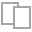
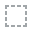
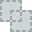
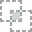
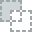
...
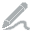
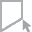
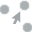
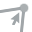
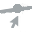

In [ ]:
create_report(basef)

##### Variables con demasiados NA

In [ ]:
porc_nas= basef.isnull().mean().reset_index(name='Porc_na')
porc_nas.sort_values('Porc_na', ascending= True)

,index,Porc_na
0,ocid,0.0
22,procurementMethod,0.0
23,procurementMethodDetails,0.0
24,mainProcurementCategory,0.0
25,awardCriteria,0.0
...,...,...
33,enquiryPeriod_durationInDays,1.0
32,enquiryPeriod_maxExtentDate,1.0
31,enquiryPeriod_endDate,1.0
11,budget_description,1.0


## Seleccion de variables que van al modelo

- coeficiente correlación (Multicolinealidad)
- porcentaje de vacíos
- la cantidad de elementos únicos porque no se va a dejar una variable categórica con muchos únicos


In [ ]:
var_eleg= ['value_amount', 'numberOfTenderers', 'mainProcurementCategory',
           'Num_Award', 'Sum_Award',
           'Byr_Num_ocid', 'Byr_Bdgt_Tot', 'Byr_TndrDurat_Mean',
           'Byr_NumTndr_Mean', 'Byr_Num_direct', 'Byr_Num_selective',
           'Byr_Num_D_BieServ',
           'ByrAwrd_Num_ocid', 'ByrAwrd_Bdgt_Tot', 'ByrAwrd_TndrDurat_Mean',
           'ByrAwrd_NumTndr_Mean', 'ByrAwrd_Num_direct', 'ByrAwrd_Num_selective',
           'ByrAwrd_Num_D_BieServ',
           'Porc_NumOcid_AwardByr', 'Porc_Amount_vs_Bdgt_AwardByr', 'Ratio_NumTndr_Mean_AwardByr',
           'Porc_direct_AwardByr',
          #  'Porc_selective_AwardByr',
           'Porc_D_BieServ_AwardByr']
var_id=['ocid', 'buyer_id','award_id']

In [ ]:
var_id + var_eleg

['ocid',
 'buyer_id',
 'award_id',
 'value_amount',
 'numberOfTenderers',
 'mainProcurementCategory',
 'Num_Award',
 'Sum_Award',
 'Byr_Num_ocid',
 'Byr_Bdgt_Tot',
 'Byr_TndrDurat_Mean',
 'Byr_NumTndr_Mean',
 'Byr_Num_direct',
 'Byr_Num_selective',
 'Byr_Num_D_BieServ',
 'ByrAwrd_Num_ocid',
 'ByrAwrd_Bdgt_Tot',
 'ByrAwrd_TndrDurat_Mean',
 'ByrAwrd_NumTndr_Mean',
 'ByrAwrd_Num_direct',
 'ByrAwrd_Num_selective',
 'ByrAwrd_Num_D_BieServ',
 'Porc_NumOcid_AwardByr',
 'Porc_Amount_vs_Bdgt_AwardByr',
 'Ratio_NumTndr_Mean_AwardByr',
 'Porc_direct_AwardByr',
 'Porc_D_BieServ_AwardByr']

In [ ]:
base_pred = basef[var_id + var_eleg].dropna()

In [ ]:
train= base_pred[ var_eleg ]
train.shape

(1813, 24)

In [ ]:
train

,value_amount,numberOfTenderers,mainProcurementCategory,Num_Award,Sum_Award,Byr_Num_ocid,Byr_Bdgt_Tot,Byr_TndrDurat_Mean,Byr_NumTndr_Mean,Byr_Num_direct,...,ByrAwrd_TndrDurat_Mean,ByrAwrd_NumTndr_Mean,ByrAwrd_Num_direct,ByrAwrd_Num_selective,ByrAwrd_Num_D_BieServ,Porc_NumOcid_AwardByr,Porc_Amount_vs_Bdgt_AwardByr,Ratio_NumTndr_Mean_AwardByr,Porc_direct_AwardByr,Porc_D_BieServ_AwardByr
128,26000.0,1.0,services,1.0,26000.0,366.0,68340210.02,13.738462,7.888889,60.0,...,7.0,1.0,1.0,0.0,1.0,0.002732,0.000380,0.126761,0.016667,0.1
154,64944.8,1.0,goods,1.0,64944.8,366.0,68340210.02,13.738462,7.888889,60.0,...,7.0,1.0,1.0,0.0,1.0,0.002732,0.000950,0.126761,0.016667,0.1
179,10000.0,1.0,services,1.0,10000.0,366.0,68340210.02,13.738462,7.888889,60.0,...,6.0,1.0,1.0,0.0,1.0,0.002732,0.000146,0.126761,0.016667,0.1
234,18500.0,1.0,services,1.0,18500.0,366.0,68340210.02,13.738462,7.888889,60.0,...,6.0,1.0,1.0,0.0,1.0,0.002732,0.000271,0.126761,0.016667,0.1
235,47245.4,1.0,services,1.0,47245.4,366.0,68340210.02,13.738462,7.888889,60.0,...,6.0,1.0,1.0,0.0,1.0,0.002732,0.000691,0.126761,0.016667,0.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196168,16331.2,1.0,goods,29.0,16331.2,2.0,16331.20,4.000000,1.000000,1.0,...,4.0,1.0,1.0,0.0,1.0,0.500000,0.028657,1.000000,1.000000,1.0
196169,16331.2,1.0,goods,29.0,16331.2,2.0,16331.20,4.000000,1.000000,1.0,...,4.0,1.0,1.0,0.0,1.0,0.500000,0.028657,1.000000,1.000000,1.0
196176,57820.0,1.0,goods,1.0,57820.0,7.0,180627.00,5.000000,3.000000,2.0,...,5.0,1.0,1.0,0.0,1.0,0.142857,0.320107,0.333333,0.500000,0.5
196177,122807.0,1.0,services,1.0,122807.0,7.0,180627.00,5.000000,3.000000,2.0,...,5.0,1.0,1.0,0.0,1.0,0.142857,0.679893,0.333333,0.500000,0.5


# MODELOS

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures

from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

## Preprocesamiento

In [ ]:
categorical_columns = ['mainProcurementCategory' ]

numerical_columns = var_eleg= [
    # 'value_amount',
    'numberOfTenderers',
           'Num_Award', 'Sum_Award',
                              #  'MaxDuration',
          #  'Byr_Num_ocid',
                               'Byr_Bdgt_Tot', 'Byr_TndrDurat_Mean',
           'Byr_NumTndr_Mean',
                              #  'Byr_Num_direct', 'Byr_Num_selective',
          #  'Byr_Num_D_BieServ',
           'ByrAwrd_Num_ocid', 'ByrAwrd_Bdgt_Tot', 'ByrAwrd_TndrDurat_Mean',
           'ByrAwrd_NumTndr_Mean', 'ByrAwrd_Num_direct', 'ByrAwrd_Num_selective',
           'ByrAwrd_Num_D_BieServ',
           'Porc_NumOcid_AwardByr', 'Porc_Amount_vs_Bdgt_AwardByr', 'Ratio_NumTndr_Mean_AwardByr',
           'Porc_direct_AwardByr',
                              #  'Porc_selective_AwardByr',
                               'Porc_D_BieServ_AwardByr']

## Isolation Forest

In [ ]:
prep = ColumnTransformer([('encoder', OneHotEncoder(), categorical_columns),
                   ('scaler', StandardScaler(),numerical_columns),],
                  remainder= 'drop')


In [ ]:
ifrst_pipe = Pipeline([('preproc', prep),
                     ('ifrst', IsolationForest(n_estimators= 200, random_state=123)  )
                  ])

In [ ]:
ifrst_pipe.fit(train)

Pipeline(steps=[('preproc',
                 ColumnTransformer(transformers=[('encoder', OneHotEncoder(),
                                                  ['mainProcurementCategory']),
                                                 ('scaler', StandardScaler(),
                                                  ['numberOfTenderers',
                                                   'Num_Award', 'Sum_Award',
                                                   'Byr_Bdgt_Tot',
                                                   'Byr_TndrDurat_Mean',
                                                   'Byr_NumTndr_Mean',
                                                   'ByrAwrd_Num_ocid',
                                                   'ByrAwrd_Bdgt_Tot',
                                                   'ByrAwrd_TndrDurat_Mean',
                                                   'ByrAwrd_NumTndr_Mean',
                                                   'ByrAwrd_Num_direct',
                                                   'ByrAwrd_Num_selective',
                                                   'ByrAwrd_Num_D_BieServ',
                                                   'Porc_NumOcid_AwardByr',
                                                   'Porc_Amount_vs_Bdgt_AwardByr',
                                                   'Ratio_NumTndr_Mean_AwardByr',
                                                   'Porc_direct_AwardByr',
                                                   'Porc_D_BieServ_AwardByr'])])),
                ('ifrst', IsolationForest(n_estimators=200, random_state=123))])

In [ ]:
base_pred.shape

(1813, 32)

In [ ]:
y_pred_ifrst= ifrst_pipe.predict( base_pred )

In [ ]:
np.unique(y_pred_ifrst, return_counts=True)

(array([-1,  1]), array([ 218, 1595]))

In [ ]:
base_pred['y_pred_ifrst']= y_pred_ifrst

##### Descriptivas por anomalia y no anomalia

In [ ]:
base_pred.groupby('y_pred_ifrst').mean()

<ipython-input-312-796909283d77>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  base_pred.groupby('y_pred_ifrst').mean()


,value_amount,numberOfTenderers,Num_Award,Sum_Award,Byr_Num_ocid,Byr_Bdgt_Tot,Byr_TndrDurat_Mean,Byr_NumTndr_Mean,Byr_Num_direct,Byr_Num_selective,...,ByrAwrd_Num_D_BieServ,Porc_NumOcid_AwardByr,Porc_Amount_vs_Bdgt_AwardByr,Ratio_NumTndr_Mean_AwardByr,Porc_direct_AwardByr,Porc_D_BieServ_AwardByr,y_pred_lof,pca_1,pca_2,pca_3
y_pred_ifrst,,,,,,,,,,,,,,,,,,,,,
-1,438662.882532,1.0,5.844037,438585.639541,157.220183,2.629745e+07,9.020281,7.817047,21.830275,13.412844,...,1.0,0.211290,0.239363,0.520163,0.565085,0.672101,0.559633,-1.313404,2.414535,-1.909568
1,64264.557249,1.0,1.209404,64222.207444,154.957994,1.307522e+07,7.900554,3.294712,22.588715,9.584326,...,1.0,0.019678,0.039627,0.374409,0.104731,0.229132,0.938558,0.179512,-0.330012,0.260994


## Local outlier Factor

In [ ]:
lof_pipe = Pipeline([('preproc', prep),
                     ('lof', LocalOutlierFactor(n_neighbors= 50, novelty=True)  )
                  ])

In [ ]:
lof_pipe.fit(train)

Pipeline(steps=[('preproc',
                 ColumnTransformer(transformers=[('encoder', OneHotEncoder(),
                                                  ['mainProcurementCategory']),
                                                 ('scaler', StandardScaler(),
                                                  ['numberOfTenderers',
                                                   'Num_Award', 'Sum_Award',
                                                   'Byr_Bdgt_Tot',
                                                   'Byr_TndrDurat_Mean',
                                                   'Byr_NumTndr_Mean',
                                                   'ByrAwrd_Num_ocid',
                                                   'ByrAwrd_Bdgt_Tot',
                                                   'ByrAwrd_TndrDurat_Mean',
                                                   'ByrAwrd_NumTndr_Mean',
                                                   'ByrAwrd_Num_direct',
                                                   'ByrAwrd_Num_selective',
                                                   'ByrAwrd_Num_D_BieServ',
                                                   'Porc_NumOcid_AwardByr',
                                                   'Porc_Amount_vs_Bdgt_AwardByr',
                                                   'Ratio_NumTndr_Mean_AwardByr',
                                                   'Porc_direct_AwardByr',
                                                   'Porc_D_BieServ_AwardByr'])])),
                ('lof', LocalOutlierFactor(n_neighbors=50, novelty=True))])

In [ ]:
y_pred_lof= lof_pipe.predict( base_pred )

In [ ]:
np.unique(y_pred_lof, return_counts=True)

(array([-1,  1]), array([ 140, 1673]))

In [ ]:
base_pred['y_pred_lof']= y_pred_lof

##### Descriptivas por anomalia y no anomalia

In [ ]:
base_pred.groupby('y_pred_lof').mean()

<ipython-input-318-48b94811e4bc>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  base_pred.groupby('y_pred_lof').mean()


,value_amount,numberOfTenderers,Num_Award,Sum_Award,Byr_Num_ocid,Byr_Bdgt_Tot,Byr_TndrDurat_Mean,Byr_NumTndr_Mean,Byr_Num_direct,Byr_Num_selective,...,ByrAwrd_Num_D_BieServ,Porc_NumOcid_AwardByr,Porc_Amount_vs_Bdgt_AwardByr,Ratio_NumTndr_Mean_AwardByr,Porc_direct_AwardByr,Porc_D_BieServ_AwardByr,y_pred_ifrst,pca_1,pca_2,pca_3
y_pred_lof,,,,,,,,,,,,,,,,,,,,,
-1,686250.095393,1.0,1.264286,686145.121607,170.757143,2.205216e+07,8.866494,10.564096,27.392857,12.492857,...,1.0,0.098921,0.179711,0.433400,0.218026,0.336642,-0.042857,0.535440,2.154913,-0.141926
1,61001.472714,1.0,1.808727,60959.816657,153.930663,1.404693e+07,7.965628,3.275678,22.087866,9.839809,...,1.0,0.038015,0.053931,0.388465,0.155236,0.277856,0.826659,-0.044807,-0.180327,0.011877


## Graficar con PCA

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca_pipe = Pipeline([('preproc', prep),
                     ('pca', PCA(n_components=3)  )
                  ])

In [ ]:
pca_pipe.fit(train)

Pipeline(steps=[('preproc',
                 ColumnTransformer(transformers=[('encoder', OneHotEncoder(),
                                                  ['mainProcurementCategory']),
                                                 ('scaler', StandardScaler(),
                                                  ['numberOfTenderers',
                                                   'Num_Award', 'Sum_Award',
                                                   'Byr_Bdgt_Tot',
                                                   'Byr_TndrDurat_Mean',
                                                   'Byr_NumTndr_Mean',
                                                   'ByrAwrd_Num_ocid',
                                                   'ByrAwrd_Bdgt_Tot',
                                                   'ByrAwrd_TndrDurat_Mean',
                                                   'ByrAwrd_NumTndr_Mean',
                                                   'ByrAwrd_Num_direct',
                                                   'ByrAwrd_Num_selective',
                                                   'ByrAwrd_Num_D_BieServ',
                                                   'Porc_NumOcid_AwardByr',
                                                   'Porc_Amount_vs_Bdgt_AwardByr',
                                                   'Ratio_NumTndr_Mean_AwardByr',
                                                   'Porc_direct_AwardByr',
                                                   'Porc_D_BieServ_AwardByr'])])),
                ('pca', PCA(n_components=3))])

In [ ]:
pca_calculado= pca_pipe.transform(train)

In [ ]:
pca_calculado.shape

(1813, 3)

In [ ]:
pca_calculado[:,0]

array([ 2.04997841,  2.01910698,  2.00428001, ..., -1.89006936,
       -2.47636524, -9.2402726 ])

In [ ]:
base_pred['pca_1']= pca_calculado[:,0]

In [ ]:
base_pred['pca_2']= pca_calculado[:,1]

In [ ]:
base_pred['pca_3']= pca_calculado[:,2]

<Axes: xlabel='pca_1', ylabel='pca_2'>

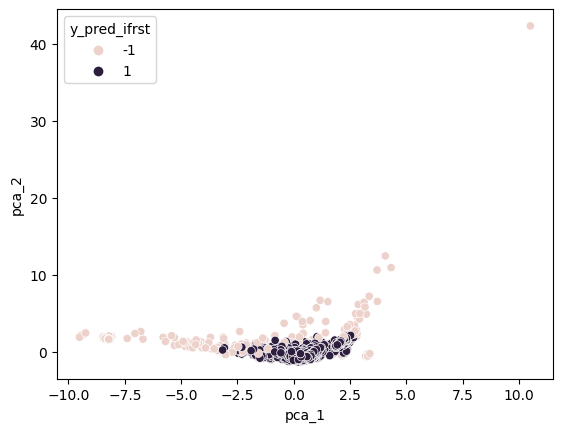

In [ ]:
sns.scatterplot( base_pred, x='pca_1', y= 'pca_2', hue= 'y_pred_ifrst' )

<Axes: xlabel='pca_3', ylabel='pca_2'>

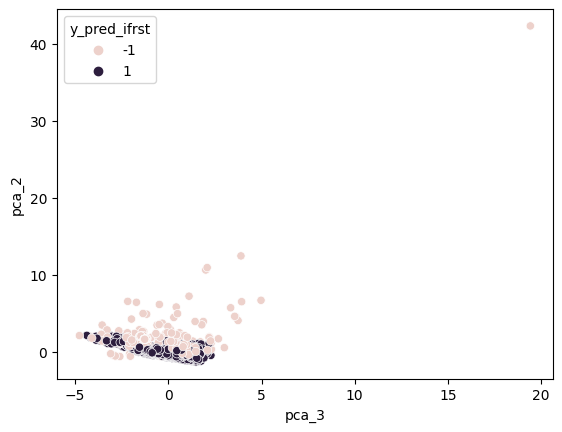

In [ ]:
sns.scatterplot( base_pred, x='pca_3', y= 'pca_2', hue= 'y_pred_ifrst' )

<Axes: xlabel='pca_1', ylabel='pca_3'>

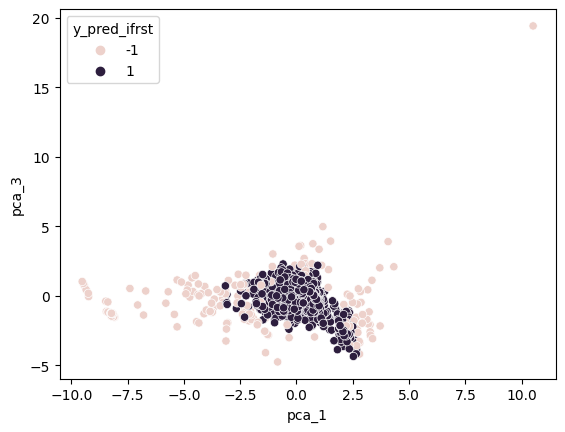

In [ ]:
sns.scatterplot( base_pred, x='pca_1', y= 'pca_3', hue= 'y_pred_ifrst' )

Idea ganadora para el concurso hacer que la visualización sea interactiva y que permita saber qué OCID - AWARID - SUPPID están quedando como anómalo y su valores (incluso comparar con el resto)

<Axes: xlabel='pca_1', ylabel='pca_2'>

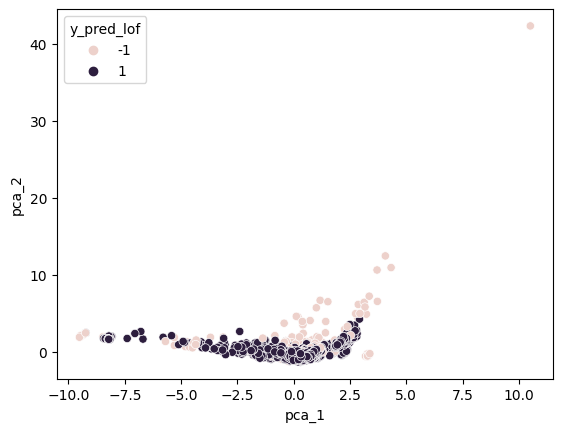

In [ ]:
sns.scatterplot( base_pred, x='pca_1', y= 'pca_2', hue= 'y_pred_lof' )

<Axes: xlabel='pca_3', ylabel='pca_2'>

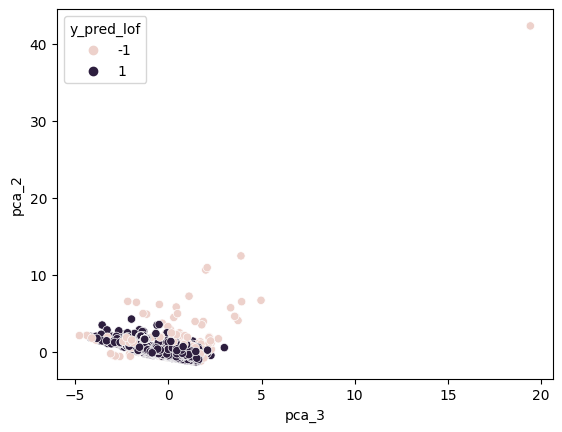

In [ ]:
sns.scatterplot( base_pred, x='pca_3', y= 'pca_2', hue= 'y_pred_lof' )

<Axes: xlabel='pca_1', ylabel='pca_3'>

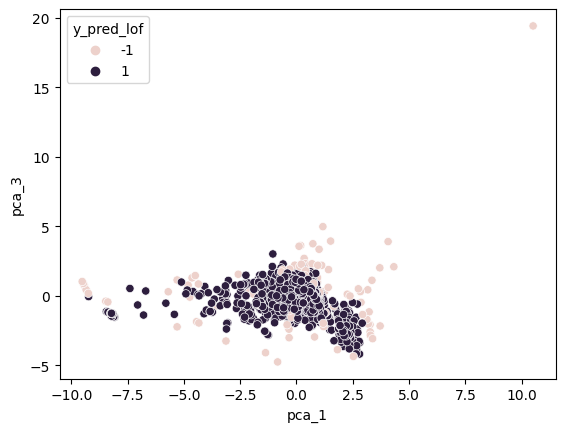

In [ ]:
sns.scatterplot( base_pred, x='pca_1', y= 'pca_3', hue= 'y_pred_lof' )